In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import scipy
from scipy import stats
from numpy.random import randn  
# 標準正規乱数はよく使うので，randn として importしておく

In [2]:
from PIL import Image
# pillowをインポートして画像を表示

# 19

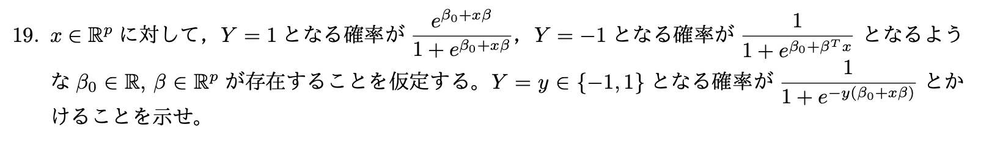

In [3]:
im = Image.open("question/q19.png")
im

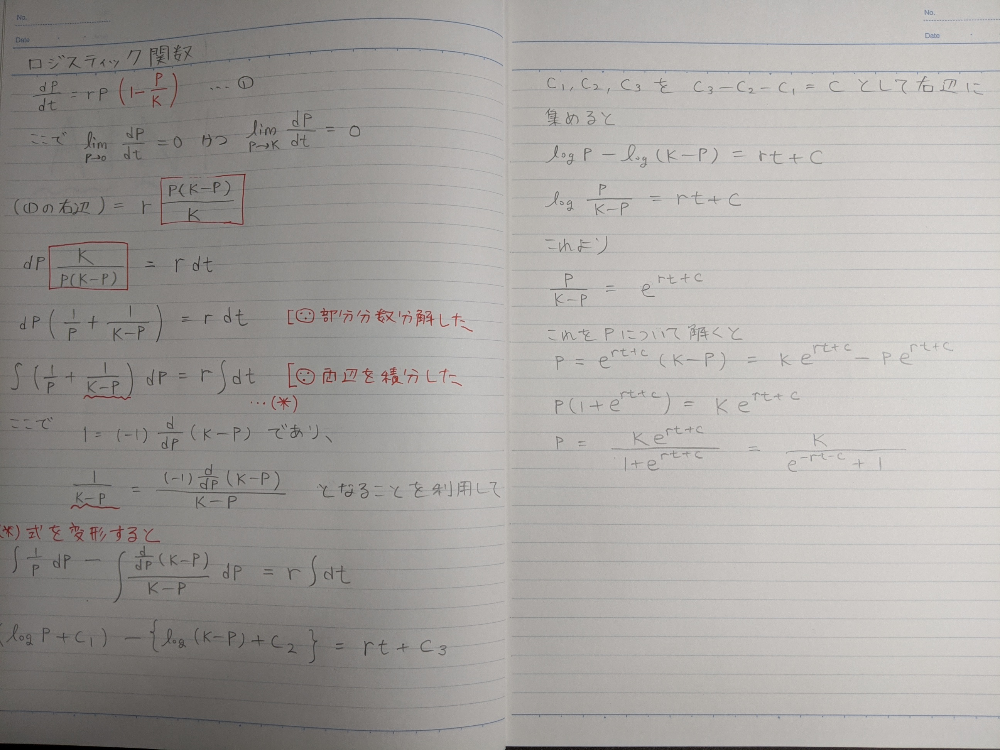

In [4]:
im = Image.open("answer/a19-logistic.jpg")
im

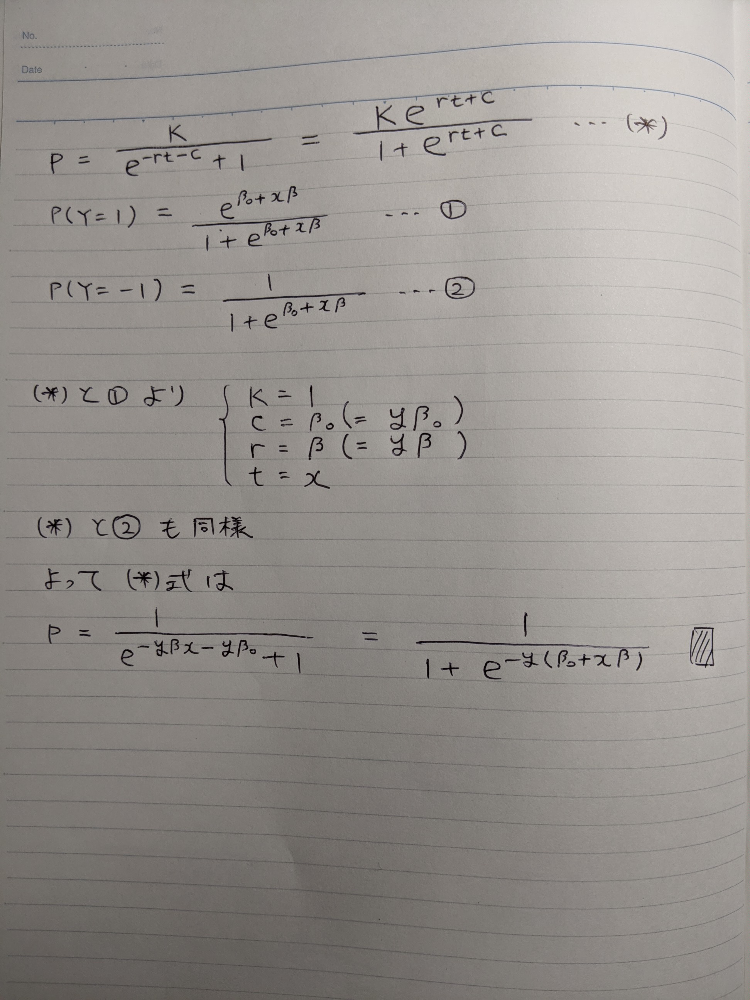

In [5]:
im = Image.open("answer/a19.jpg")
im

# 20

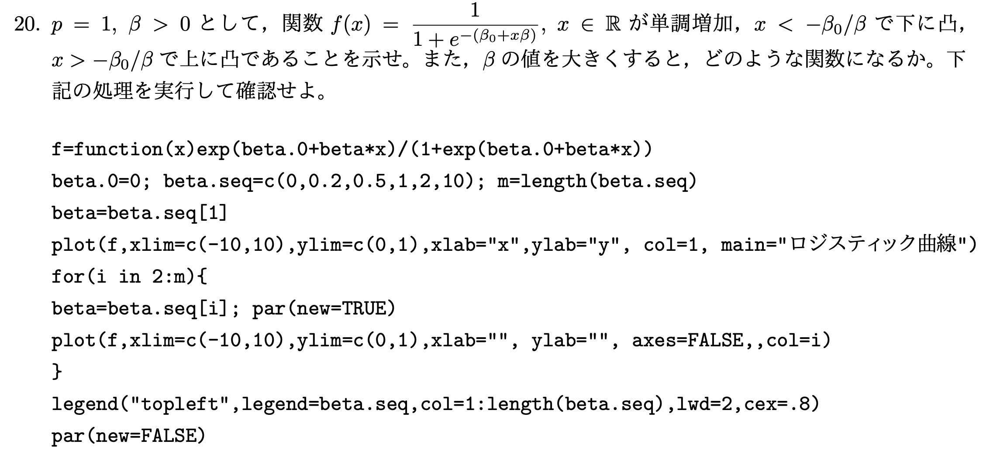

In [6]:
im = Image.open("question/q20.png")
im

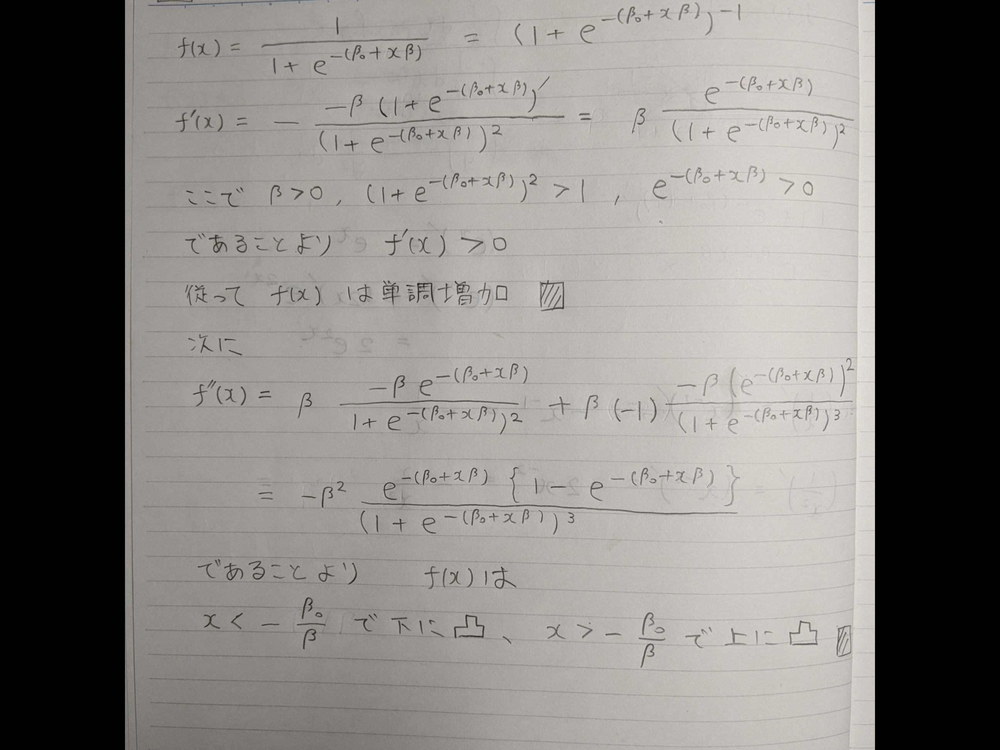

In [7]:
# 問題の前半部分：
im = Image.open("answer/a20.jpg")
im.rotate(-90)

In [8]:
# 問題の後半部分：
def f(x):
    return np.exp(beta_0+beta*x)/(1+np.exp(beta_0+beta*x))

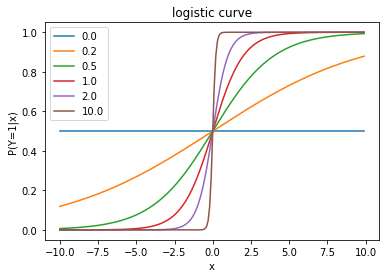

In [9]:
beta_0=0
beta_seq=np.array([0,0.2,0.5,1,2,10])
x_seq=np.arange(-10,10,0.1)

plt.xlabel("x")
plt.ylabel("P(Y=1|x)")
plt.title("logistic curve")
for i in range(beta_seq.shape[0]):
    beta=beta_seq[i]
    p=f(x_seq)
    plt.plot(x_seq,p,label='{}'.format(beta))
plt.legend(loc='upper left')

# 22

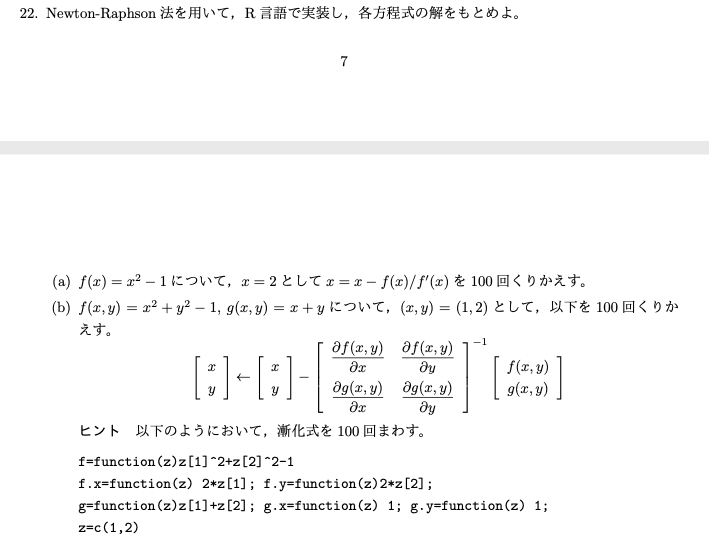

In [10]:
im = Image.open("question/q22.png")
im

In [11]:
# (a)

def f(x):
    return x**2 - 1

def df(x):
    return 2 * x

In [12]:
x = 2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

1.0

In [13]:
x = -2  # 初期値
for i in range(100):
    x = x - f(x)/df(x)
x

-1.0

初期値によって結果が変化する

In [14]:
#(b)

def f(z):
    return z[0]**2 + z[1]**2 - 1

def dfx(z):
    return 2 * z[0]

def dfy(z):
    return 2 * z[1]

def g(z):
    return z[0] + z[1]

def dgx(z):
    return 1

def dgy(z):
    return 1

In [15]:
# 初期値
z = np.array([1,2])

for i in range(100):
    jacob = np.array([[dfx(z), dfy(z)], [dgx(z), dgy(z)]])
    z = z - np.linalg.inv(jacob) @ np.array([f(z), g(z)])
z

array([-0.70710678,  0.70710678])

In [16]:
f(z)

2.220446049250313e-16

In [17]:
g(z)

0.0

f(x,y)とg(x,y)のどちらも0と見なしてよい。

# 24

In [18]:
N=1000; p=2
X=randn(N,p) 
X

array([[ 0.16530645,  0.58284832],
       [-0.40778148, -0.33912852],
       [ 0.02865569, -1.50662429],
       ...,
       [ 0.95280637, -0.03391839],
       [ 1.60772053, -0.12007726],
       [ 0.22258667,  0.7489377 ]])

In [19]:
X=np.insert(X, 0, 1, axis=1)
X

array([[ 1.        ,  0.16530645,  0.58284832],
       [ 1.        , -0.40778148, -0.33912852],
       [ 1.        ,  0.02865569, -1.50662429],
       ...,
       [ 1.        ,  0.95280637, -0.03391839],
       [ 1.        ,  1.60772053, -0.12007726],
       [ 1.        ,  0.22258667,  0.7489377 ]])

In [20]:
beta=randn(p+1)
beta

array([-0.43806965,  1.31543969, -1.49390781])

In [21]:
y=[]
prob=1/(1+np.exp(X@beta))
prob

array([0.74863409, 0.6148759 , 0.13582794, 0.9203753 , 0.60247443,
       0.80985548, 0.76241732, 0.51413148, 0.34031845, 0.56370768,
       0.33835381, 0.5418149 , 0.79039556, 0.35093422, 0.69753193,
       0.45478658, 0.601463  , 0.57654594, 0.63158997, 0.80532344,
       0.75302243, 0.98139536, 0.17637176, 0.9190373 , 0.94412469,
       0.68605141, 0.08385484, 0.73795943, 0.9617002 , 0.00954799,
       0.88691529, 0.01689393, 0.96083235, 0.84262376, 0.91133282,
       0.99500263, 0.57387918, 0.92811226, 0.05686971, 0.79612288,
       0.83390358, 0.31720681, 0.69914275, 0.19672528, 0.22631519,
       0.89662277, 0.97772715, 0.51079588, 0.6195379 , 0.42687005,
       0.9472944 , 0.54939984, 0.35541317, 0.99066942, 0.89740313,
       0.01962928, 0.74783353, 0.3934542 , 0.95521004, 0.17418383,
       0.0642051 , 0.31594144, 0.2736704 , 0.55524867, 0.51410369,
       0.40102337, 0.93980272, 0.37699549, 0.12606589, 0.43250987,
       0.14107984, 0.97882284, 0.16758118, 0.9978747 , 0.37376

In [24]:
len(prob)

1000

In [25]:
for i in range(N):
    if (np.random.rand(1)>prob[i]):
        y.append(1)
    else :
        y.append(-1)
#データの生成ここまで

In [23]:
#最尤推定
beta=np.inf
gamma=randn(p+1) #betaの初期値
print(gamma)
while (np.sum((beta-gamma)**2)>0.001):
    beta=gamma
    s = X@beta
    v = np.exp(-s*y)
    u = (y*v)/(1+v)  # (N,)
    w = v/(1+v)**2  # (N,)
    W = np.diag(w)  # (N,N)
    z = s+u/w
    
    gamma=np.linalg.inv(X.T@W@X)@X.T@W@z
    print (gamma)

[1.19628516 1.15826865 0.17738791]
[-1.02267309  0.02997411 -1.50854366]
[-0.15893405  1.16784017 -0.90955237]
[-0.3907973   1.16849175 -1.33520623]
[-0.4308538   1.22275228 -1.4375265 ]
[-0.43289866  1.22641922 -1.44314137]


gammaはほぼbetaと同じ値に収束していることが確認できた